# Microcontroller Instance Segmentation with COCO dataformat
<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

<table align="left"><td>
  <a target="_blank"  href="https://colab.research.google.com/github/TannerGilbert/Detectron2-Train-a-Instance-Segmentation-Model/blob/master/Microcontroller_Instance_Segmentation_with_COCO_dataformat.ipynb">
    <img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab
  </a>
</td><td>
  <a target="_blank"  href="https://github.com/TannerGilbert/Detectron2-Train-a-Instance-Segmentation-Model/blob/master/Microcontroller_Instance_Segmentation_with_COCO_dataformat.ipynb">
    <img width=32px src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
</td></table>

## Install detectron2

> **Important**: If you're running on a local machine, be sure to follow the [installation instructions](https://github.com/facebookresearch/detectron2/blob/master/INSTALL.md). This notebook includes only what's necessary to run in Colab.

In [1]:
#!pip install pyyaml==5.1
# This is the current pytorch version on Colab. Uncomment this if Colab changes its pytorch version
# !pip install torch==1.9.0+cu102 torchvision==0.10.0+cu102 -f https://download.pytorch.org/whl/torch_stable.html

# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
#!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu102/torch1.9/index.html
# exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

In [2]:
# check pytorch installation: 
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
assert torch.__version__.startswith("1.8")   # please manually install torch 1.9 if Colab changes its default version

1.8.1+cu102 True


## Get data

In [3]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

## Register data-set

In order to use a dataset with Detectron2 we need to register it. For more information check out the official documentation.

In [4]:
from detectron2.data.datasets import register_coco_instances

for d in ["train", "test"]:
    register_coco_instances(f"newTestKit_{d}", {}, f"newTestKit/{d}.json", f"newTestKit/{d}")

WARNING [04/15 22:41:52 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/15 22:41:52 d2.data.datasets.coco]: Loaded 1144 images in COCO format from newTestKit/train.json


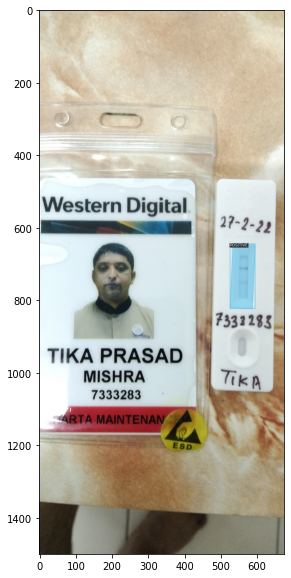

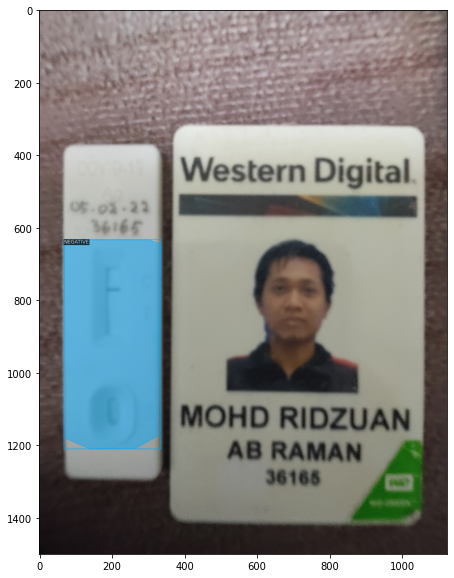

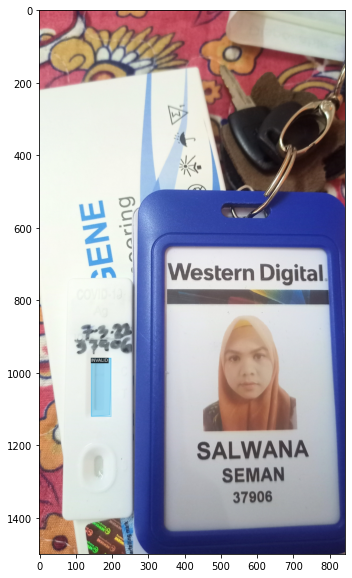

In [5]:
import random
from detectron2.data import DatasetCatalog, MetadataCatalog

dataset_dicts = DatasetCatalog.get("newTestKit_train")
#microcontroller_metadata = MetadataCatalog.get("dataset_dicts").thing_colors = [(0,255,0), (255,0,0),(0,0,255)]

#microcontroller_metadata = MetadataCatalog.get("newTestKit_train").set(thing_classes=['INVALID','NEGATIVE', 'POSITIVE'])
#MetadataCatalog.get("microcontroller_" + d).set(thing_classes=['Raspberry_Pi_3', 'Arduino_Nano', 'ESP8266', 'Heltec_ESP32_Lora'])
#MetadataCatalog.get("newTestKit_train").set(thing_colors=[(208, 240, 192), (255, 204, 203)])
#microcontroller_metadata = MetadataCatalog.get("newTestKit_train").set(thing_colors=[(208, 240, 192), (255, 204, 203),(0,0,255)] )
microcontroller_metadata = MetadataCatalog.get("newTestKit_train")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    
    v = Visualizer(img[:, :, ::-1], metadata=microcontroller_metadata)
    v = v.draw_dataset_dict(d)
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

## Train model

Now, let's fine-tune a pretrained FasterRCNN instance segmentation model on the microcontroller data-set.

In [6]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
#cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("newTestKit_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00035
cfg.SOLVER.MAX_ITER = 4200
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3

In [7]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("newTestKit_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00033
cfg.SOLVER.MAX_ITER = 6000
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3
cfg.OUTPUT_DIR= "/home/student/Downloads/testkit-20210909T062412Z-001"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[04/15 22:41:55 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

WARNING [04/15 22:41:55 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/15 22:41:55 d2.data.datasets.coco]: Loaded 1144 images in COCO format from newTestKit/train.json
[04/15 22:41:55 d2.data.build]: Removed 0 images with no usable annotations. 1144 images left.
[04/15 22:41:55 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|  INVALID   | 211          |  NEGATIVE  | 527          |  POSITIVE  | 428          |
|            |              |            |              |            |              |
|   total    | 1166         |            |              |            |              |
[04/15 22:41:55 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 8

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (12, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (12,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (3, 256, 1, 1) 

[04/15 22:41:57 d2.engine.train_loop]: Starting training from iteration 0
[04/15 22:42:08 d2.utils.events]:  eta: 0:57:38  iter: 19  total_loss: 2.26  loss_cls: 1.465  loss_box_reg: 0.03259  loss_mask: 0.6874  loss_rpn_cls: 0.04024  loss_rpn_loc: 0.01061  time: 0.5537  data_time: 0.0343  lr: 6.5937e-06  max_mem: 3641M
[04/15 22:42:19 d2.utils.events]:  eta: 0:52:22  iter: 39  total_loss: 2.008  loss_cls: 1.226  loss_box_reg: 0.02785  loss_mask: 0.6693  loss_rpn_cls: 0.05956  loss_rpn_loc: 0.009123  time: 0.5436  data_time: 0.0034  lr: 1.3187e-05  max_mem: 3702M
[04/15 22:42:30 d2.utils.events]:  eta: 0:51:04  iter: 59  total_loss: 1.56  loss_cls: 0.7702  loss_box_reg: 0.03667  loss_mask: 0.6531  loss_rpn_cls: 0.03818  loss_rpn_loc: 0.01195  time: 0.5405  data_time: 0.0034  lr: 1.9781e-05  max_mem: 3822M
[04/15 22:42:40 d2.utils.events]:  eta: 0:50:42  iter: 79  total_loss: 1.154  loss_cls: 0.3984  loss_box_reg: 0.04656  loss_mask: 0.6136  loss_rpn_cls: 0.04048  loss_rpn_loc: 0.009927  

[04/15 22:48:05 d2.utils.events]:  eta: 0:48:25  iter: 659  total_loss: 0.5192  loss_cls: 0.1019  loss_box_reg: 0.1183  loss_mask: 0.2662  loss_rpn_cls: 0.0008647  loss_rpn_loc: 0.005293  time: 0.5563  data_time: 0.0035  lr: 0.00021758  max_mem: 3822M
[04/15 22:48:16 d2.utils.events]:  eta: 0:48:15  iter: 679  total_loss: 0.5116  loss_cls: 0.1004  loss_box_reg: 0.119  loss_mask: 0.2745  loss_rpn_cls: 0.001405  loss_rpn_loc: 0.004834  time: 0.5568  data_time: 0.0037  lr: 0.00022418  max_mem: 3822M
[04/15 22:48:28 d2.utils.events]:  eta: 0:48:11  iter: 699  total_loss: 0.526  loss_cls: 0.09966  loss_box_reg: 0.1141  loss_mask: 0.3035  loss_rpn_cls: 0.0003678  loss_rpn_loc: 0.004433  time: 0.5579  data_time: 0.0032  lr: 0.00023077  max_mem: 3822M
[04/15 22:48:40 d2.utils.events]:  eta: 0:48:03  iter: 719  total_loss: 0.4979  loss_cls: 0.09254  loss_box_reg: 0.1234  loss_mask: 0.2925  loss_rpn_cls: 0.0001193  loss_rpn_loc: 0.005512  time: 0.5583  data_time: 0.0035  lr: 0.00023736  max_mem:

[04/15 22:54:08 d2.utils.events]:  eta: 0:43:08  iter: 1299  total_loss: 0.4046  loss_cls: 0.1063  loss_box_reg: 0.09043  loss_mask: 0.2066  loss_rpn_cls: 0.0001324  loss_rpn_loc: 0.004544  time: 0.5615  data_time: 0.0033  lr: 0.00033  max_mem: 3822M
[04/15 22:54:20 d2.utils.events]:  eta: 0:42:58  iter: 1319  total_loss: 0.4128  loss_cls: 0.1002  loss_box_reg: 0.08463  loss_mask: 0.2319  loss_rpn_cls: 0.0001661  loss_rpn_loc: 0.004291  time: 0.5618  data_time: 0.0032  lr: 0.00033  max_mem: 3822M
[04/15 22:54:32 d2.utils.events]:  eta: 0:42:48  iter: 1339  total_loss: 0.4006  loss_cls: 0.08687  loss_box_reg: 0.0749  loss_mask: 0.2309  loss_rpn_cls: 6.834e-05  loss_rpn_loc: 0.004604  time: 0.5622  data_time: 0.0034  lr: 0.00033  max_mem: 3822M
[04/15 22:54:43 d2.utils.events]:  eta: 0:42:35  iter: 1359  total_loss: 0.3825  loss_cls: 0.0969  loss_box_reg: 0.0776  loss_mask: 0.2341  loss_rpn_cls: 4.485e-05  loss_rpn_loc: 0.003652  time: 0.5621  data_time: 0.0035  lr: 0.00033  max_mem: 382

[04/15 23:00:14 d2.utils.events]:  eta: 0:37:21  iter: 1939  total_loss: 0.4408  loss_cls: 0.09235  loss_box_reg: 0.07514  loss_mask: 0.2582  loss_rpn_cls: 0.000169  loss_rpn_loc: 0.003497  time: 0.5644  data_time: 0.0032  lr: 0.00033  max_mem: 3822M
[04/15 23:00:25 d2.utils.events]:  eta: 0:37:06  iter: 1959  total_loss: 0.3607  loss_cls: 0.07934  loss_box_reg: 0.07121  loss_mask: 0.204  loss_rpn_cls: 0.0003548  loss_rpn_loc: 0.004205  time: 0.5643  data_time: 0.0036  lr: 0.00033  max_mem: 3822M
[04/15 23:00:36 d2.utils.events]:  eta: 0:36:55  iter: 1979  total_loss: 0.3673  loss_cls: 0.09497  loss_box_reg: 0.06876  loss_mask: 0.1965  loss_rpn_cls: 0.0001231  loss_rpn_loc: 0.002681  time: 0.5644  data_time: 0.0035  lr: 0.00033  max_mem: 3822M
[04/15 23:00:48 d2.utils.events]:  eta: 0:36:41  iter: 1999  total_loss: 0.3801  loss_cls: 0.09494  loss_box_reg: 0.07863  loss_mask: 0.2213  loss_rpn_cls: 8.041e-05  loss_rpn_loc: 0.003435  time: 0.5644  data_time: 0.0034  lr: 0.00033  max_mem: 

[04/15 23:06:20 d2.utils.events]:  eta: 0:31:48  iter: 2579  total_loss: 0.37  loss_cls: 0.09404  loss_box_reg: 0.06996  loss_mask: 0.2227  loss_rpn_cls: 9.525e-05  loss_rpn_loc: 0.003109  time: 0.5663  data_time: 0.0032  lr: 0.00033  max_mem: 3822M
[04/15 23:06:32 d2.utils.events]:  eta: 0:31:55  iter: 2599  total_loss: 0.4407  loss_cls: 0.08762  loss_box_reg: 0.08432  loss_mask: 0.2533  loss_rpn_cls: 0.0001317  loss_rpn_loc: 0.004523  time: 0.5664  data_time: 0.0035  lr: 0.00033  max_mem: 3822M
[04/15 23:06:44 d2.utils.events]:  eta: 0:31:59  iter: 2619  total_loss: 0.4204  loss_cls: 0.08719  loss_box_reg: 0.08531  loss_mask: 0.2267  loss_rpn_cls: 5.963e-05  loss_rpn_loc: 0.00323  time: 0.5665  data_time: 0.0034  lr: 0.00033  max_mem: 3822M
[04/15 23:06:55 d2.utils.events]:  eta: 0:31:51  iter: 2639  total_loss: 0.3668  loss_cls: 0.08375  loss_box_reg: 0.07608  loss_mask: 0.1847  loss_rpn_cls: 0.0001069  loss_rpn_loc: 0.002684  time: 0.5665  data_time: 0.0033  lr: 0.00033  max_mem: 3

[04/15 23:12:25 d2.utils.events]:  eta: 0:25:34  iter: 3219  total_loss: 0.3575  loss_cls: 0.07004  loss_box_reg: 0.07161  loss_mask: 0.2166  loss_rpn_cls: 0.0002752  loss_rpn_loc: 0.003702  time: 0.5669  data_time: 0.0033  lr: 0.00033  max_mem: 3822M
[04/15 23:12:37 d2.utils.events]:  eta: 0:25:23  iter: 3239  total_loss: 0.3767  loss_cls: 0.06258  loss_box_reg: 0.06058  loss_mask: 0.2384  loss_rpn_cls: 0.0001403  loss_rpn_loc: 0.003263  time: 0.5670  data_time: 0.0033  lr: 0.00033  max_mem: 3822M
[04/15 23:12:48 d2.utils.events]:  eta: 0:25:09  iter: 3259  total_loss: 0.3811  loss_cls: 0.08316  loss_box_reg: 0.07083  loss_mask: 0.206  loss_rpn_cls: 0.0004924  loss_rpn_loc: 0.003689  time: 0.5668  data_time: 0.0035  lr: 0.00033  max_mem: 3822M
[04/15 23:12:59 d2.utils.events]:  eta: 0:24:58  iter: 3279  total_loss: 0.3948  loss_cls: 0.07129  loss_box_reg: 0.08168  loss_mask: 0.2326  loss_rpn_cls: 0.0001732  loss_rpn_loc: 0.003914  time: 0.5668  data_time: 0.0035  lr: 0.00033  max_mem:

[04/15 23:18:28 d2.utils.events]:  eta: 0:19:31  iter: 3859  total_loss: 0.3369  loss_cls: 0.06561  loss_box_reg: 0.06824  loss_mask: 0.1908  loss_rpn_cls: 7.322e-05  loss_rpn_loc: 0.00274  time: 0.5668  data_time: 0.0033  lr: 0.00033  max_mem: 3822M
[04/15 23:18:39 d2.utils.events]:  eta: 0:19:19  iter: 3879  total_loss: 0.3628  loss_cls: 0.06754  loss_box_reg: 0.06577  loss_mask: 0.2109  loss_rpn_cls: 8.948e-05  loss_rpn_loc: 0.002545  time: 0.5668  data_time: 0.0032  lr: 0.00033  max_mem: 3822M
[04/15 23:18:51 d2.utils.events]:  eta: 0:19:10  iter: 3899  total_loss: 0.3276  loss_cls: 0.05542  loss_box_reg: 0.05877  loss_mask: 0.208  loss_rpn_cls: 8.625e-05  loss_rpn_loc: 0.002862  time: 0.5667  data_time: 0.0032  lr: 0.00033  max_mem: 3822M
[04/15 23:19:02 d2.utils.events]:  eta: 0:18:57  iter: 3919  total_loss: 0.3393  loss_cls: 0.06923  loss_box_reg: 0.06201  loss_mask: 0.2033  loss_rpn_cls: 7.836e-05  loss_rpn_loc: 0.003179  time: 0.5666  data_time: 0.0031  lr: 0.00033  max_mem: 

[04/15 23:24:31 d2.utils.events]:  eta: 0:13:39  iter: 4499  total_loss: 0.3058  loss_cls: 0.05891  loss_box_reg: 0.06017  loss_mask: 0.1916  loss_rpn_cls: 6.637e-05  loss_rpn_loc: 0.003237  time: 0.5667  data_time: 0.0037  lr: 0.00033  max_mem: 3822M
[04/15 23:24:42 d2.utils.events]:  eta: 0:13:27  iter: 4519  total_loss: 0.2785  loss_cls: 0.03962  loss_box_reg: 0.058  loss_mask: 0.1725  loss_rpn_cls: 2.872e-05  loss_rpn_loc: 0.002227  time: 0.5667  data_time: 0.0036  lr: 0.00033  max_mem: 3822M
[04/15 23:24:54 d2.utils.events]:  eta: 0:13:17  iter: 4539  total_loss: 0.3275  loss_cls: 0.0634  loss_box_reg: 0.06457  loss_mask: 0.2001  loss_rpn_cls: 0.0001219  loss_rpn_loc: 0.00281  time: 0.5668  data_time: 0.0032  lr: 0.00033  max_mem: 3822M
[04/15 23:25:06 d2.utils.events]:  eta: 0:13:06  iter: 4559  total_loss: 0.3042  loss_cls: 0.05812  loss_box_reg: 0.05739  loss_mask: 0.1913  loss_rpn_cls: 5.109e-05  loss_rpn_loc: 0.003366  time: 0.5668  data_time: 0.0033  lr: 0.00033  max_mem: 38

[04/15 23:30:35 d2.utils.events]:  eta: 0:07:50  iter: 5139  total_loss: 0.2899  loss_cls: 0.04549  loss_box_reg: 0.06003  loss_mask: 0.1753  loss_rpn_cls: 7.617e-05  loss_rpn_loc: 0.003504  time: 0.5665  data_time: 0.0036  lr: 0.00033  max_mem: 3822M
[04/15 23:30:46 d2.utils.events]:  eta: 0:07:39  iter: 5159  total_loss: 0.2929  loss_cls: 0.04365  loss_box_reg: 0.06047  loss_mask: 0.1718  loss_rpn_cls: 7.628e-05  loss_rpn_loc: 0.004193  time: 0.5665  data_time: 0.0034  lr: 0.00033  max_mem: 3822M
[04/15 23:30:58 d2.utils.events]:  eta: 0:07:29  iter: 5179  total_loss: 0.3452  loss_cls: 0.05502  loss_box_reg: 0.06905  loss_mask: 0.2121  loss_rpn_cls: 2.102e-05  loss_rpn_loc: 0.002947  time: 0.5666  data_time: 0.0038  lr: 0.00033  max_mem: 3822M
[04/15 23:31:10 d2.utils.events]:  eta: 0:07:19  iter: 5199  total_loss: 0.2901  loss_cls: 0.05746  loss_box_reg: 0.06026  loss_mask: 0.1808  loss_rpn_cls: 0.0001294  loss_rpn_loc: 0.003537  time: 0.5666  data_time: 0.0034  lr: 0.00033  max_mem

[04/15 23:36:41 d2.utils.events]:  eta: 0:02:01  iter: 5779  total_loss: 0.2818  loss_cls: 0.04755  loss_box_reg: 0.05913  loss_mask: 0.1669  loss_rpn_cls: 5.777e-05  loss_rpn_loc: 0.004117  time: 0.5669  data_time: 0.0033  lr: 0.00033  max_mem: 3822M
[04/15 23:36:52 d2.utils.events]:  eta: 0:01:50  iter: 5799  total_loss: 0.2893  loss_cls: 0.04745  loss_box_reg: 0.05727  loss_mask: 0.1767  loss_rpn_cls: 7.463e-05  loss_rpn_loc: 0.004225  time: 0.5669  data_time: 0.0033  lr: 0.00033  max_mem: 3822M
[04/15 23:37:03 d2.utils.events]:  eta: 0:01:39  iter: 5819  total_loss: 0.3129  loss_cls: 0.05482  loss_box_reg: 0.05919  loss_mask: 0.1748  loss_rpn_cls: 4.23e-05  loss_rpn_loc: 0.003135  time: 0.5669  data_time: 0.0035  lr: 0.00033  max_mem: 3822M
[04/15 23:37:14 d2.utils.events]:  eta: 0:01:27  iter: 5839  total_loss: 0.2837  loss_cls: 0.04971  loss_box_reg: 0.06651  loss_mask: 0.1593  loss_rpn_cls: 3.555e-05  loss_rpn_loc: 0.00331  time: 0.5669  data_time: 0.0034  lr: 0.00033  max_mem: 

## Use model for inference

Now, we can perform inference on our validation set by creating a predictor object.

In [8]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 
cfg.DATASETS.TEST = ("newTestKit_test", )
cfg.MODEL.DEVICE='cpu'
predictor = DefaultPredictor(cfg)
def _create_text_labels(classes, scores, class_names, is_crowd=None):
    """
    Args:
        classes (list[int] or None):
        scores (list[float] or None):
        class_names (list[str] or None):
        is_crowd (list[bool] or None):

    Returns:
        list[str] or None
    """
    labels = None
    if classes is not None:
        if class_names is not None and len(class_names) > 0:
            labels = [class_names[i] for i in classes]
        else:
            labels = [str(i) for i in classes]
    if scores is not None:
        if labels is None:
            labels = ["{:.0f}%".format(s * 100) for s in scores]
        else:
            labels = ["{} {:.0f}%".format(l, s * 100) for l, s in zip(labels, scores)]
    if labels is not None and is_crowd is not None:
        labels = [l + ("|crowd" if crowd else "") for l, crowd in zip(labels, is_crowd)]
    return labels


WARNING [04/15 23:38:49 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/15 23:38:49 d2.data.datasets.coco]: Loaded 1144 images in COCO format from newTestKit/train.json
NEGATIVE 99%
0 99
Boxes(tensor([[ 138.4017, 1299.6151,  762.8917, 2611.6965]]))


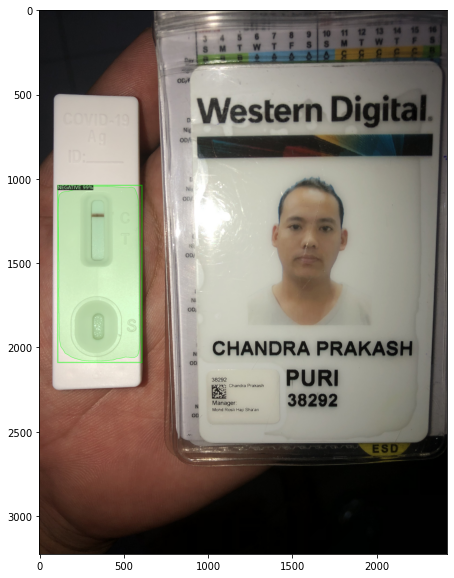

NEGATIVE 97%
0 97
Boxes(tensor([[2167.3438, 1839.1938, 2604.6548, 3069.6484]]))


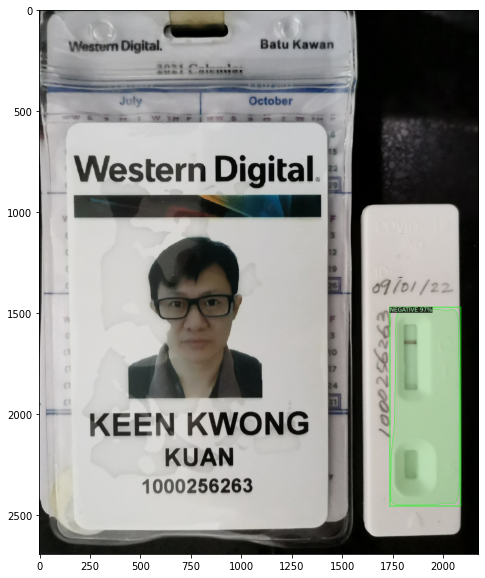

POSITIVE 84%
0 84
Boxes(tensor([[1307.9761, 1513.5477, 1419.0334, 1800.0414],
        [1203.3109, 1501.6086, 1515.4061, 2111.6943]]))


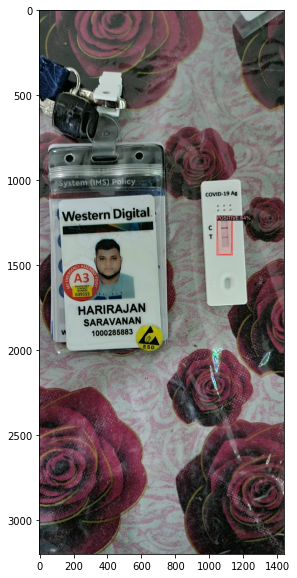

NEGATIVE 91%
0 91
Boxes(tensor([[481.7141, 203.7951, 792.3943, 348.7781]]))


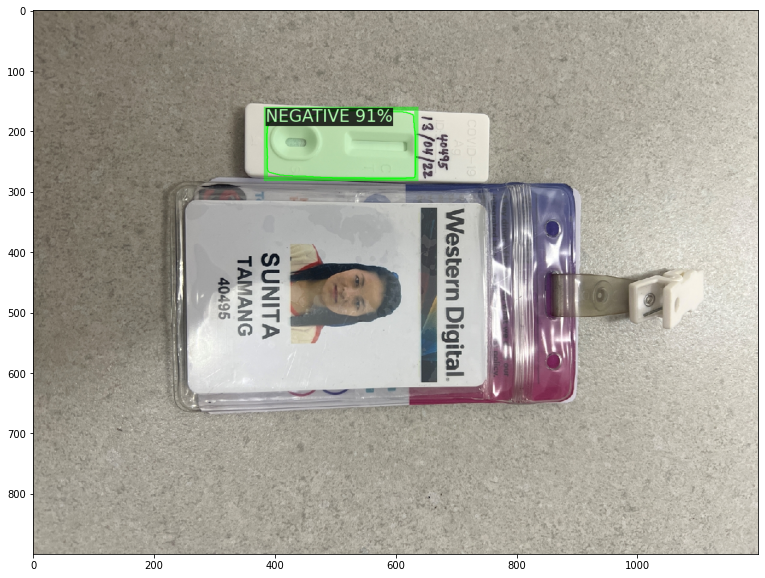

POSITIVE 88%
0 88
Boxes(tensor([[282.4326,  63.1845, 583.7277, 230.0402],
        [263.8005,  50.4391, 850.4774, 232.2822]]))


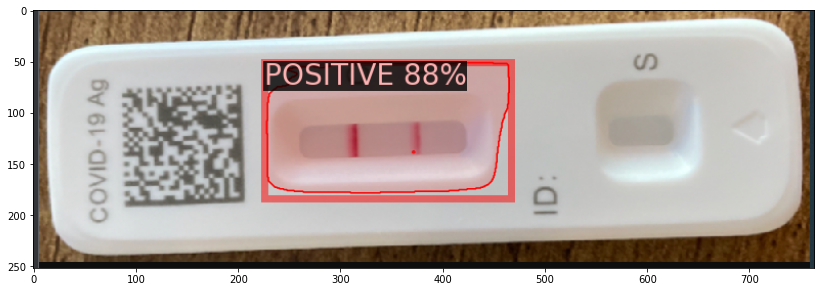

POSITIVE 89%
0 89
Boxes(tensor([[209.3245, 439.6517, 274.8862, 632.8765]]))


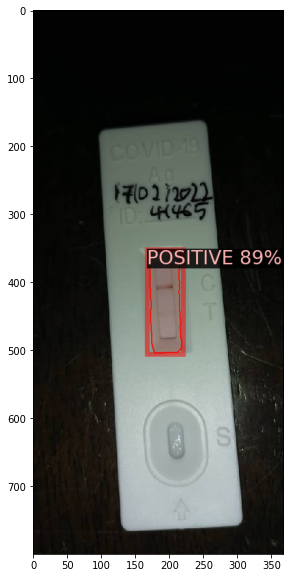

INVALID 65%
0 65
Boxes(tensor([[ 890.4882,  685.8281, 1068.1018, 1146.0026],
        [ 900.7773,  653.7656, 1062.5133, 1163.7455]]))


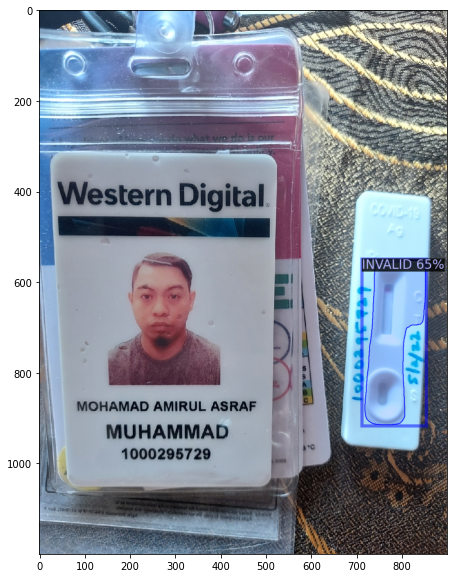

NEGATIVE 93%
0 93
Boxes(tensor([[2010.6920, 2322.9172, 2322.8936, 3225.2139]]))


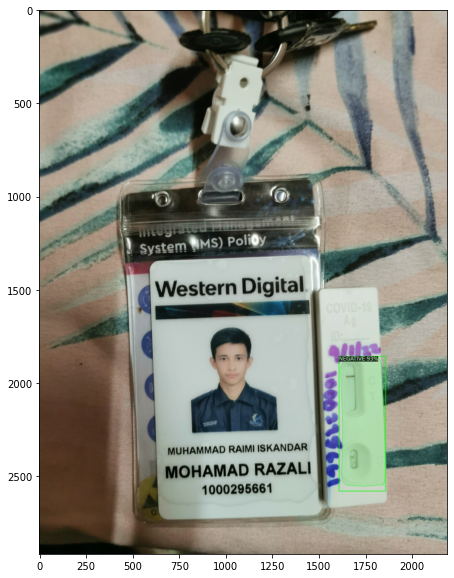

POSITIVE 92%
0 92
Boxes(tensor([[ 230.4635,  898.6401,  290.0406, 1045.1562]]))


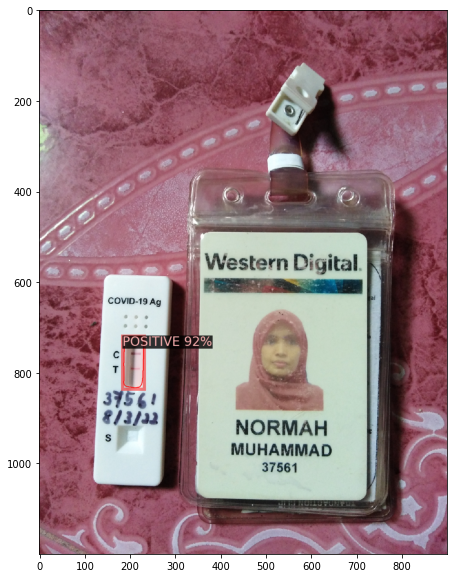

POSITIVE 92%
0 92
Boxes(tensor([[124.9673, 714.4849, 212.6181, 959.6045]]))


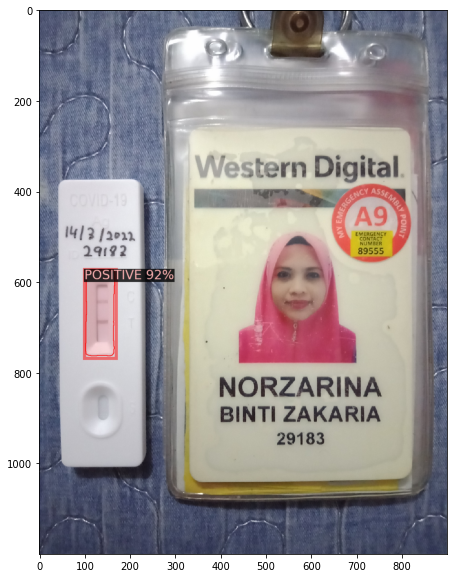

NEGATIVE 97%
0 97
Boxes(tensor([[1674.6259, 1191.8795, 2011.5999, 2160.9492]]))


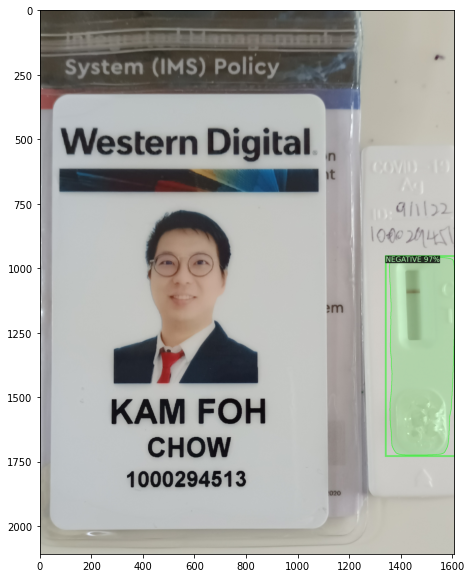

INVALID 92%
0 92
Boxes(tensor([[ 140.5886,  856.4500,  333.3403, 1343.9360]]))


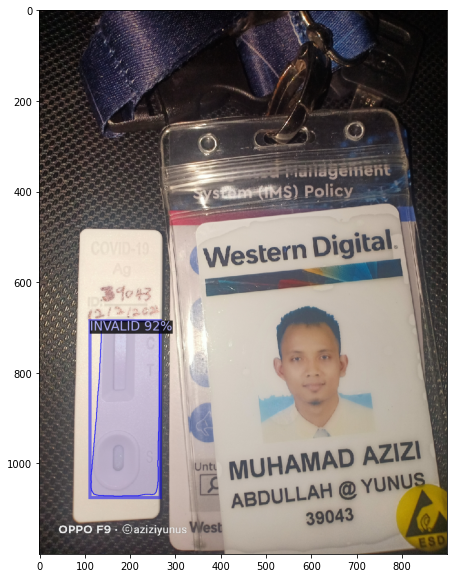

NEGATIVE 97%
0 97
Boxes(tensor([[ 577.0935,  927.7119,  693.6931, 1188.2317]]))


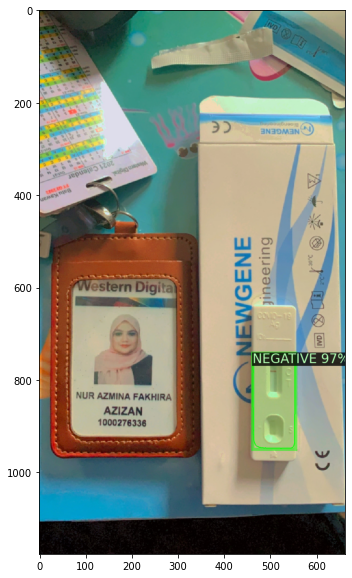

POSITIVE 86%
0 86
Boxes(tensor([[ 187.6652,  668.8330,  309.6837,  902.5596],
        [ 187.1178,  666.1302,  319.1044, 1117.0626]]))


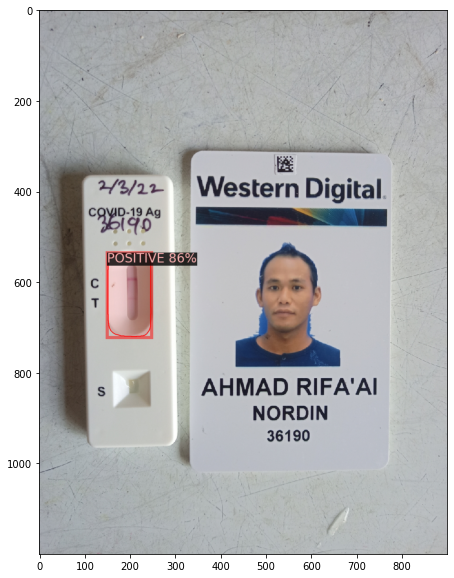

NEGATIVE 94%
0 94
Boxes(tensor([[ 838.3458,  710.1606,  965.1540, 1245.8784]]))


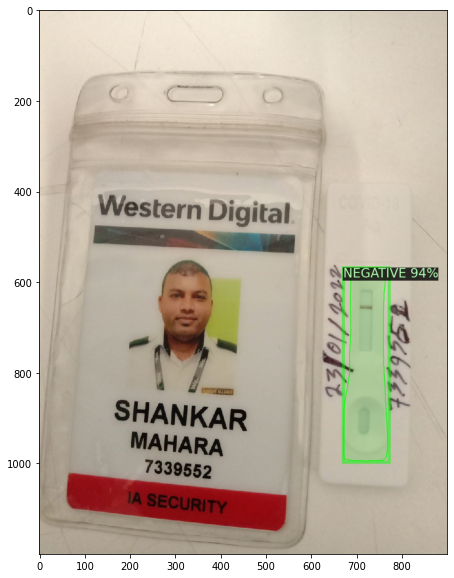

POSITIVE 76%
0 76
Boxes(tensor([[1159.4945, 1090.8301, 1479.2770, 1703.0935]]))


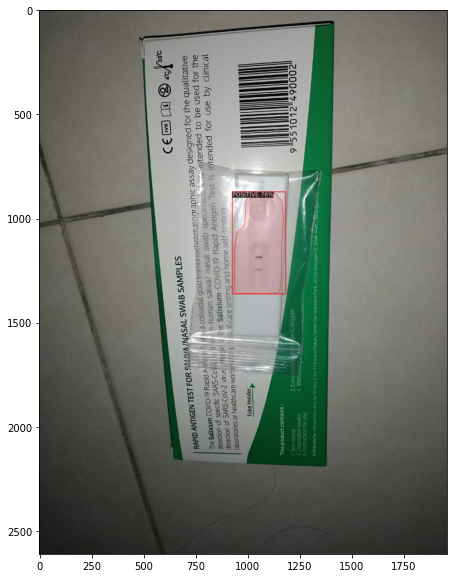

INVALID 72%
0 72
Boxes(tensor([[  99.5688,  741.1479,  290.5385, 1206.7926],
        [ 105.8263,  724.1251,  289.7320, 1217.4156]]))


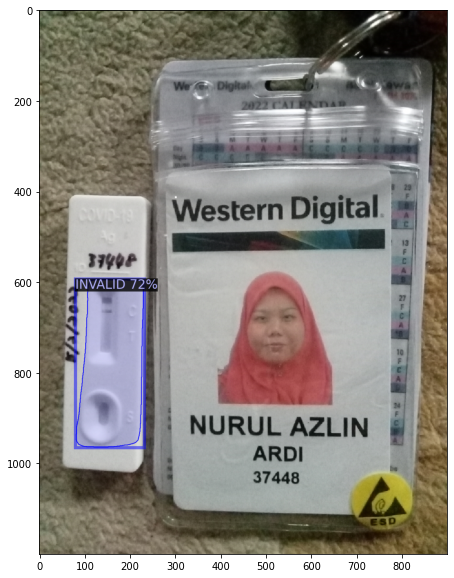

POSITIVE 89%
0 89
Boxes(tensor([[ 48.0072, 526.4774,  99.9214, 643.0159]]))


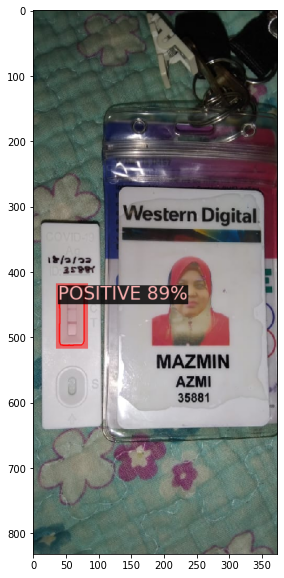

NEGATIVE 98%
0 98
Boxes(tensor([[223.6850, 255.5957, 261.8980, 379.6306]]))


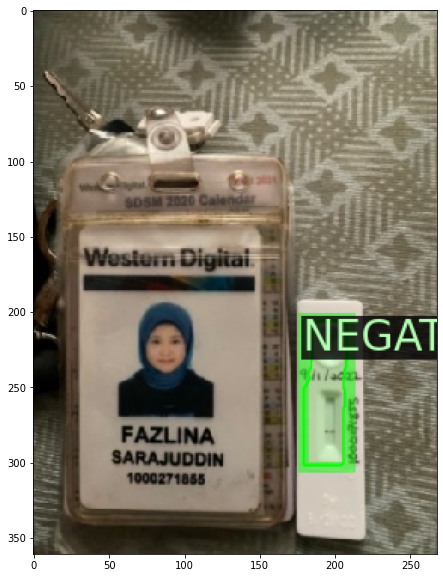

NEGATIVE 92%
0 92
Boxes(tensor([[121.9533, 128.2578, 664.8632, 382.9553]]))


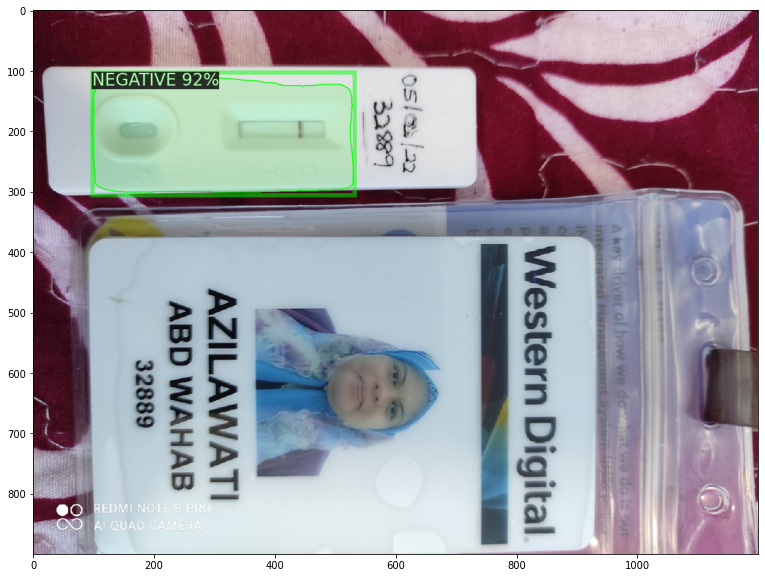

In [9]:
from detectron2.utils.visualizer import ColorMode
from detectron2.utils.visualizer import GenericMask
import random
import tensorflow as tf
dataset_dicts = DatasetCatalog.get("newTestKit_train")
#MetadataCatalog.get("testKit_test").set(thing_classes=["NEGATIVE","POSITIVE"])
for d in random.sample(dataset_dicts, 20):  
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], scale=0.8,instance_mode=ColorMode.SEGMENTATION,
                   metadata=microcontroller_metadata)
    v._default_font_size = 35
    
    #v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    #v._default_font_size = 40
    #with tf.compat.v1.Session() as sess:
    #    result = outputs["instances"].scores.eval()
    predictions = outputs["instances"].to("cpu")
    boxes = predictions.pred_boxes if predictions.has("pred_boxes") else None
    scores = predictions.scores if predictions.has("scores") else None
    classes = predictions.pred_classes.tolist() if predictions.has("pred_classes") else None
    labels = _create_text_labels(classes, scores, v.metadata.get("thing_classes", None))
    keypoints = predictions.pred_keypoints if predictions.has("pred_keypoints") else None
    if outputs["instances"].to("cpu").has("pred_masks"):
            masks = np.asarray(outputs["instances"].to("cpu").pred_masks)
            masks = [GenericMask(x, v.output.height, v.output.width) for x in masks]
    colors =[]
    
    max1 = -1
    pos = -1
    for i in range(len(labels)):
        if int(labels[i][-3:-1])>max1:
            max1= int(labels[i][-3:-1])
            pos=i
    print(labels[pos])
    print(pos, max1)
    for i in range(len(classes)):
        if classes[pos]==0:
            colors.append((0,0,1))
        elif classes[pos]==1:
            colors.append((0,1,0))
        elif classes[pos]==2:
            colors.append((1,0,0))
            
    labels1 = labels[i]        
    #for i in range(len(classes)):
    #    if classes[i]==0:
    #        colors.append((208/255, 240/255, 192/255))
    #    elif classes[i]==1:
    #        colors.append((255/255, 204/255, 203/255))
    alpha = 0.14 
    print(boxes)
    #if v._instance_mode == ColorMode.SEGMENTATION and v.metadata.get("thing_colors"):
    #    colors = [(208/255, 240/255, 192/255), (255/255, 204/255, 203/255)]
    #    alpha = 0.5
    v.num_instances=1
    mask1 = [masks[pos]]
    boxes1=boxes[pos]
    labels1=[labels[pos]]
    #eypoints1=[keypoints[pos]]
    colors1=[colors[pos]]
    #rint(masks,boxes,labels,colors)
    #rint(mask1,boxes1,labels1,colors1)
    if pos !=-1:
        v=v.overlay_instances(
            masks=mask1,
            boxes=boxes1,
            labels=labels1,
            keypoints=keypoints,
            assigned_colors=colors1,
            alpha=alpha)
    
    r1 = str(outputs["instances"].scores)[7:]
    level1 = str(r1[:-18])
    array1=[]
    for i in outputs["instances"].pred_classes.tolist():
        if i ==0:
            array1.append("INVALID")
        elif i ==1:
            array1.append("NEGATIVE")
        elif i ==2:
            array1.append("POSITIVE")
    label1=array1[pos]
   #label1 = str(array1)
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.savefig('image3.png')
    plt.show()

In [10]:
cfg.OUTPUT_DIR

'/home/student/Downloads/testkit-20210909T062412Z-001'

NEGATIVE 93%
0 93
Boxes(tensor([[ 53.9352, 186.9329, 179.5197, 466.8628]]))


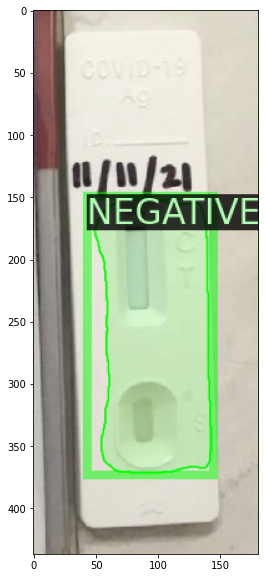

In [11]:
if 1==1:  
    im = cv2.imread("kit2.jpg")
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], scale=0.8,instance_mode=ColorMode.SEGMENTATION,
                   metadata=microcontroller_metadata)
    v._default_font_size = 35
    
    #v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    #v._default_font_size = 40
    #with tf.compat.v1.Session() as sess:
    #    result = outputs["instances"].scores.eval()
    predictions = outputs["instances"].to("cpu")
    boxes = predictions.pred_boxes if predictions.has("pred_boxes") else None
    scores = predictions.scores if predictions.has("scores") else None
    classes = predictions.pred_classes.tolist() if predictions.has("pred_classes") else None
    labels = _create_text_labels(classes, scores, v.metadata.get("thing_classes", None))
    keypoints = predictions.pred_keypoints if predictions.has("pred_keypoints") else None
    if outputs["instances"].to("cpu").has("pred_masks"):
            masks = np.asarray(outputs["instances"].to("cpu").pred_masks)
            masks = [GenericMask(x, v.output.height, v.output.width) for x in masks]
    colors =[]
    
    max1 = -1
    pos = -1
    for i in range(len(labels)):
        if int(labels[i][-3:-1])>max1:
            max1= int(labels[i][-3:-1])
            pos=i
    print(labels[pos])
    print(pos, max1)
    for i in range(len(classes)):
        if classes[pos]==0:
            colors.append((0,0,1))
        elif classes[pos]==1:
            colors.append((0,1,0))
        elif classes[pos]==2:
            colors.append((1,0,0))
            
    labels1 = labels[i]        
    #for i in range(len(classes)):
    #    if classes[i]==0:
    #        colors.append((208/255, 240/255, 192/255))
    #    elif classes[i]==1:
    #        colors.append((255/255, 204/255, 203/255))
    alpha = 0.14 
    print(boxes)
    #if v._instance_mode == ColorMode.SEGMENTATION and v.metadata.get("thing_colors"):
    #    colors = [(208/255, 240/255, 192/255), (255/255, 204/255, 203/255)]
    #    alpha = 0.5
    v.num_instances=1
    mask1 = [masks[pos]]
    boxes1=boxes[pos]
    labels1=[labels[pos]]
    #eypoints1=[keypoints[pos]]
    colors1=[colors[pos]]
    #rint(masks,boxes,labels,colors)
    #rint(mask1,boxes1,labels1,colors1)
    if pos !=-1:
        v=v.overlay_instances(
            masks=mask1,
            boxes=boxes1,
            labels=labels1,
            keypoints=keypoints,
            assigned_colors=colors1,
            alpha=alpha)
    
    r1 = str(outputs["instances"].scores)[7:]
    level1 = str(r1[:-18])
    array1=[]
    for i in outputs["instances"].pred_classes.tolist():
        if i ==0:
            array1.append("INVALID")
        elif i ==1:
            array1.append("NEGATIVE")
        elif i ==2:
            array1.append("POSITIVE")
    label1=array1[pos]
   #label1 = str(array1)
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.savefig('image3.png')
    plt.show()

INVALID 76%
0 76
Boxes(tensor([[ 18.0434, 689.2595, 304.9560, 948.4141]]))


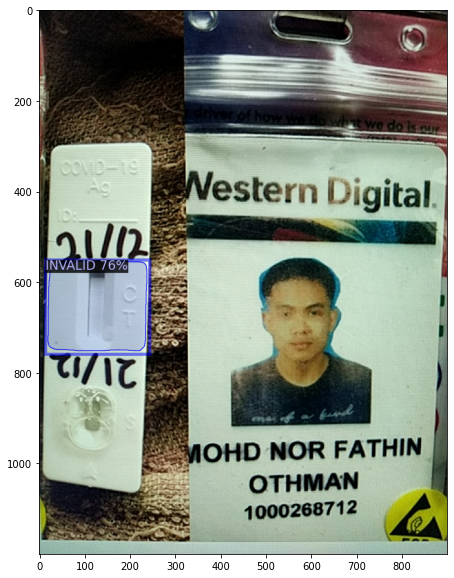

In [12]:
if 1==1:  
    im = cv2.imread("covid1.png")
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], scale=0.8,instance_mode=ColorMode.SEGMENTATION,
                   metadata=microcontroller_metadata)
    v._default_font_size = 35
    
    #v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    #v._default_font_size = 40
    #with tf.compat.v1.Session() as sess:
    #    result = outputs["instances"].scores.eval()
    predictions = outputs["instances"].to("cpu")
    boxes = predictions.pred_boxes if predictions.has("pred_boxes") else None
    scores = predictions.scores if predictions.has("scores") else None
    classes = predictions.pred_classes.tolist() if predictions.has("pred_classes") else None
    labels = _create_text_labels(classes, scores, v.metadata.get("thing_classes", None))
    keypoints = predictions.pred_keypoints if predictions.has("pred_keypoints") else None
    if outputs["instances"].to("cpu").has("pred_masks"):
            masks = np.asarray(outputs["instances"].to("cpu").pred_masks)
            masks = [GenericMask(x, v.output.height, v.output.width) for x in masks]
    colors =[]
    
    max1 = -1
    pos = -1
    for i in range(len(labels)):
        if int(labels[i][-3:-1])>max1:
            max1= int(labels[i][-3:-1])
            pos=i
    print(labels[pos])
    print(pos, max1)
    for i in range(len(classes)):
        if classes[pos]==0:
            colors.append((0,0,1))
        elif classes[pos]==1:
            colors.append((0,1,0))
        elif classes[pos]==2:
            colors.append((1,0,0))
            
    labels1 = labels[i]        
    #for i in range(len(classes)):
    #    if classes[i]==0:
    #        colors.append((208/255, 240/255, 192/255))
    #    elif classes[i]==1:
    #        colors.append((255/255, 204/255, 203/255))
    alpha = 0.14 
    print(boxes)
    #if v._instance_mode == ColorMode.SEGMENTATION and v.metadata.get("thing_colors"):
    #    colors = [(208/255, 240/255, 192/255), (255/255, 204/255, 203/255)]
    #    alpha = 0.5
    v.num_instances=1
    mask1 = [masks[pos]]
    boxes1=boxes[pos]
    labels1=[labels[pos]]
    #eypoints1=[keypoints[pos]]
    colors1=[colors[pos]]
    #rint(masks,boxes,labels,colors)
    #rint(mask1,boxes1,labels1,colors1)
    if pos !=-1:
        v=v.overlay_instances(
            masks=mask1,
            boxes=boxes1,
            labels=labels1,
            keypoints=keypoints,
            assigned_colors=colors1,
            alpha=alpha)
    
    r1 = str(outputs["instances"].scores)[7:]
    level1 = str(r1[:-18])
    array1=[]
    for i in outputs["instances"].pred_classes.tolist():
        if i ==0:
            array1.append("INVALID")
        elif i ==1:
            array1.append("NEGATIVE")
        elif i ==2:
            array1.append("POSITIVE")
    label1=array1[pos]
   #label1 = str(array1)
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.savefig('image3.png')
    plt.show()

In [13]:
import time
start = time.process_time()

for i in range(1):
    im = cv2.imread("covid1.png")
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], scale=0.8,instance_mode=ColorMode.SEGMENTATION,
                   metadata=microcontroller_metadata)
    v._default_font_size = 35
    
    #v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    #v._default_font_size = 40
    #with tf.compat.v1.Session() as sess:
    #    result = outputs["instances"].scores.eval()
    predictions = outputs["instances"].to("cpu")
    boxes = predictions.pred_boxes if predictions.has("pred_boxes") else None
    scores = predictions.scores if predictions.has("scores") else None
    classes = predictions.pred_classes.tolist() if predictions.has("pred_classes") else None
    labels = _create_text_labels(classes, scores, v.metadata.get("thing_classes", None))
    keypoints = predictions.pred_keypoints if predictions.has("pred_keypoints") else None
    if outputs["instances"].to("cpu").has("pred_masks"):
            masks = np.asarray(outputs["instances"].to("cpu").pred_masks)
            masks = [GenericMask(x, v.output.height, v.output.width) for x in masks]
    colors =[]
    
    max1 = -1
    pos = -1
    for i in range(len(labels)):
        if int(labels[i][-3:-1])>max1:
            max1= int(labels[i][-3:-1])
            pos=i
    print(labels[pos])
    #print(pos, max1)
    for i in range(len(classes)):
        if classes[pos]==0:
            colors.append((0,0,1))
        elif classes[pos]==1:
            colors.append((0,1,0))
        elif classes[pos]==2:
            colors.append((1,0,0))
            
    labels1 = labels[i]        
    #for i in range(len(classes)):
    #    if classes[i]==0:
    #        colors.append((208/255, 240/255, 192/255))
    #    elif classes[i]==1:
    #        colors.append((255/255, 204/255, 203/255))
    alpha = 0.14 
    print(boxes)
    #if v._instance_mode == ColorMode.SEGMENTATION and v.metadata.get("thing_colors"):
    #    colors = [(208/255, 240/255, 192/255), (255/255, 204/255, 203/255)]
    #    alpha = 0.5
    v.num_instances=1
    mask1 = [masks[pos]]
    boxes1=boxes[pos]
    labels1=[labels[pos]]
    #eypoints1=[keypoints[pos]]
    colors1=[colors[pos]]
    #rint(masks,boxes,labels,colors)
    #rint(mask1,boxes1,labels1,colors1)
    if pos !=-1:
        v=v.overlay_instances(
            masks=mask1,
            boxes=boxes1,
            labels=labels1,
            keypoints=keypoints,
            assigned_colors=colors1,
            alpha=alpha)
    
    r1 = str(outputs["instances"].scores)[7:]
    level1 = str(r1[:-18])
    array1=[]
    for i in outputs["instances"].pred_classes.tolist():
        if i ==0:
            array1.append("INVALID")
        elif i ==1:
            array1.append("NEGATIVE")
        elif i ==2:
            array1.append("POSITIVE")
    label1=array1[pos]
    
print(time.process_time() - start)

INVALID 76%
Boxes(tensor([[ 18.0434, 689.2595, 304.9560, 948.4141]]))
12.199619734999942


In [14]:
import time
start = time.process_time()

for i in range(1):
    im = cv2.imread("a9.jpeg")
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], scale=0.8,instance_mode=ColorMode.SEGMENTATION,
                   metadata=microcontroller_metadata)
    v._default_font_size = 35
    
    #v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    #v._default_font_size = 40
    #with tf.compat.v1.Session() as sess:
    #    result = outputs["instances"].scores.eval()
    predictions = outputs["instances"].to("cpu")
    boxes = predictions.pred_boxes if predictions.has("pred_boxes") else None
    scores = predictions.scores if predictions.has("scores") else None
    classes = predictions.pred_classes.tolist() if predictions.has("pred_classes") else None
    labels = _create_text_labels(classes, scores, v.metadata.get("thing_classes", None))
    keypoints = predictions.pred_keypoints if predictions.has("pred_keypoints") else None
    if outputs["instances"].to("cpu").has("pred_masks"):
            masks = np.asarray(outputs["instances"].to("cpu").pred_masks)
            masks = [GenericMask(x, v.output.height, v.output.width) for x in masks]
    colors =[]
    
    max1 = -1
    pos = -1
    for i in range(len(labels)):
        if int(labels[i][-3:-1])>max1:
            max1= int(labels[i][-3:-1])
            pos=i
    print(labels[pos])
    #print(pos, max1)
    for i in range(len(classes)):
        if classes[pos]==0:
            colors.append((0,0,1))
        elif classes[pos]==1:
            colors.append((0,1,0))
        elif classes[pos]==2:
            colors.append((1,0,0))
            
    labels1 = labels[i]        
    #for i in range(len(classes)):
    #    if classes[i]==0:
    #        colors.append((208/255, 240/255, 192/255))
    #    elif classes[i]==1:
    #        colors.append((255/255, 204/255, 203/255))
    alpha = 0.14 
    print(boxes)
    #if v._instance_mode == ColorMode.SEGMENTATION and v.metadata.get("thing_colors"):
    #    colors = [(208/255, 240/255, 192/255), (255/255, 204/255, 203/255)]
    #    alpha = 0.5
    v.num_instances=1
    mask1 = [masks[pos]]
    boxes1=boxes[pos]
    labels1=[labels[pos]]
    #eypoints1=[keypoints[pos]]
    colors1=[colors[pos]]
    #rint(masks,boxes,labels,colors)
    #rint(mask1,boxes1,labels1,colors1)
    if pos !=-1:
        v=v.overlay_instances(
            masks=mask1,
            boxes=boxes1,
            labels=labels1,
            keypoints=keypoints,
            assigned_colors=colors1,
            alpha=alpha)
    
    r1 = str(outputs["instances"].scores)[7:]
    level1 = str(r1[:-18])
    array1=[]
    for i in outputs["instances"].pred_classes.tolist():
        if i ==0:
            array1.append("INVALID")
        elif i ==1:
            array1.append("NEGATIVE")
        elif i ==2:
            array1.append("POSITIVE")
    label1=array1[pos]
    
print(time.process_time() - start)

NEGATIVE 95%
Boxes(tensor([[ 113.4451,  817.6965,  356.9777, 1362.6365]]))
12.19977205999976


In [15]:
import time
start = time.process_time()

for i in range(1):
    im = cv2.imread("a9.jpeg")
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], scale=0.8,instance_mode=ColorMode.SEGMENTATION,
                   metadata=microcontroller_metadata)
    v._default_font_size = 35
    
    #v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    #v._default_font_size = 40
    #with tf.compat.v1.Session() as sess:
    #    result = outputs["instances"].scores.eval()
    predictions = outputs["instances"].to("cpu")
    boxes = predictions.pred_boxes if predictions.has("pred_boxes") else None
    scores = predictions.scores if predictions.has("scores") else None
    classes = predictions.pred_classes.tolist() if predictions.has("pred_classes") else None
    labels = _create_text_labels(classes, scores, v.metadata.get("thing_classes", None))
    keypoints = predictions.pred_keypoints if predictions.has("pred_keypoints") else None
    if outputs["instances"].to("cpu").has("pred_masks"):
            masks = np.asarray(outputs["instances"].to("cpu").pred_masks)
            masks = [GenericMask(x, v.output.height, v.output.width) for x in masks]
    colors =[]
    
    max1 = -1
    pos = -1
    for i in range(len(labels)):
        if int(labels[i][-3:-1])>max1:
            max1= int(labels[i][-3:-1])
            pos=i
    print(labels[pos])
    #print(pos, max1)
    for i in range(len(classes)):
        if classes[pos]==0:
            colors.append((0,0,1))
        elif classes[pos]==1:
            colors.append((0,1,0))
        elif classes[pos]==2:
            colors.append((1,0,0))
            
    labels1 = labels[i]        
    #for i in range(len(classes)):
    #    if classes[i]==0:
    #        colors.append((208/255, 240/255, 192/255))
    #    elif classes[i]==1:
    #        colors.append((255/255, 204/255, 203/255))
    alpha = 0.14 
    print(boxes)
    #if v._instance_mode == ColorMode.SEGMENTATION and v.metadata.get("thing_colors"):
    #    colors = [(208/255, 240/255, 192/255), (255/255, 204/255, 203/255)]
    #    alpha = 0.5
    v.num_instances=1
    mask1 = [masks[pos]]
    boxes1=boxes[pos]
    labels1=[labels[pos]]
    #eypoints1=[keypoints[pos]]
    colors1=[colors[pos]]
    #rint(masks,boxes,labels,colors)
    #rint(mask1,boxes1,labels1,colors1)
    if pos !=-1:
        v=v.overlay_instances(
            masks=mask1,
            boxes=boxes1,
            labels=labels1,
            keypoints=keypoints,
            assigned_colors=colors1,
            alpha=alpha)
    
    r1 = str(outputs["instances"].scores)[7:]
    level1 = str(r1[:-18])
    array1=[]
    for i in outputs["instances"].pred_classes.tolist():
        if i ==0:
            array1.append("INVALID")
        elif i ==1:
            array1.append("NEGATIVE")
        elif i ==2:
            array1.append("POSITIVE")
    label1=array1[pos]
    
print(time.process_time() - start)

NEGATIVE 95%
Boxes(tensor([[ 113.4451,  817.6965,  356.9777, 1362.6365]]))
12.150411780000013


In [16]:
import subprocess

In [17]:
res=subprocess.run(['nvidia-smi','--query-gpu=memory.used', '--format=csv'])
print(res.stdout)

None
